In [1]:
import os
import sys
sys.path.append(os.path.abspath("/users/amtseng/tfmodisco/notebooks/reports/"))
sys.path.append(os.path.abspath("/users/amtseng/tfmodisco/src/"))
import plot.viz_sequence as viz_sequence
from util import figure_to_vdom_image
import h5py
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as font_manager
import vdom.helpers as vdomh
from IPython.display import display
import tqdm
tqdm.tqdm_notebook(range(1))

/users/amtseng/miniconda3/envs/tfmodisco-mini/lib/python3.7/site-packages/ipykernel_launcher.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|<bar/>| 0/1 [00:00<?, ?it/s]

In [2]:
# Plotting defaults
font_manager.fontManager.ttflist.extend(
    font_manager.createFontList(
        font_manager.findSystemFonts(fontpaths="/users/amtseng/modules/fonts")
    )
)
plot_params = {
    "figure.titlesize": 22,
    "axes.titlesize": 22,
    "axes.labelsize": 20,
    "legend.fontsize": 18,
    "xtick.labelsize": 16,
    "ytick.labelsize": 16,
    "font.family": "Roboto",
    "font.weight": "bold",
    "svg.fonttype": "none"
}
plt.rcParams.update(plot_params)

/users/amtseng/miniconda3/envs/tfmodisco-mini/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The createFontList function was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use FontManager.addfont instead.
  after removing the cwd from sys.path.


In [3]:
tf_name = "E2F6"
num_tasks = 2

tfm_motif_file = "/users/amtseng/tfmodisco/results/motifs/tfmodisco/%s_tfmodisco_cpmerged_motifs.h5" % tf_name
meme_motif_file = "/users/amtseng/tfmodisco/results/motifs/meme/%s_meme_motifs.h5" % tf_name
homer_motif_file = "/users/amtseng/tfmodisco/results/motifs/homer/%s_homer_motifs.h5" % tf_name
dichipmunk_motif_file = "/users/amtseng/tfmodisco/results/motifs/dichipmunk/%s_dichipmunk_motifs.h5" % tf_name

best_model_types = list("MM")

### Helper functions

In [4]:
def import_tfmodisco_motifs(motif_file, model_types):
    """
    From a file containing all motifs for that TF, imports the
    trimmed CWMs of the fine-tuned models corresponding to the
    model type for each task.
    Returns a list of dictionaries (one for each task), where
    each dictionary maps motif key to motif.
    """
    motifs = []
    with h5py.File(motif_file, "r") as f:
        mtft = f["multitask_finetune"]
        stft = f["singletask_finetune"]
        for i, model_type in enumerate(model_types):
            task = "task_%d" % i
            if model_type == "M":
                dset = mtft[task]
            else:
                dset = stft[task]
            task_motifs = {}
            for motif_key in dset.keys():
                task_motifs["T%d:%s" % (i, motif_key)] = dset[motif_key]["cwm_trimmed"][:]
            motifs.append(task_motifs)
    return motifs

In [5]:
def import_classic_benchmark_motifs(motif_file, mode):
    """
    From a file containing all motifs for that TF from a benchmark
    method, imports the PFMs of the motifs for each task.
    Returns a list of dictionaries (one for each task), where
    each dictionary maps motif key to motif.
    """
    if mode == "dichipmunk":
        score_key = "supporting_seqs"
    elif mode == "homer":
        score_key = "log_enrichment"
    elif mode == "meme":
        score_key = "evalue"
    motifs = []
    with h5py.File(motif_file, "r") as f:
        tasks = sorted([int(key[5:]) for key in f.keys() if key != "task_agg"])
        for i in tasks:
            dset = f["task_%d" % i]
            task_motifs = {}
            for motif_key in dset.keys():
                if motif_key == score_key:
                    continue
                task_motifs["T%d:%s" % (i, motif_key)] = dset[motif_key][:]
            motifs.append(task_motifs)
    return motifs

In [6]:
def motif_similarity_score(motif_1, motif_2, average=True, align_to_longer=True):
    """
    Computes the motif similarity score between two motifs by
    the summed cosine similarity, maximized over all possible sliding
    windows. Also returns the index relative to the start of `motif_2`
    where `motif_1` should be placed to maximize this score.
    If `average` is True, then use average of similarity of overlap.
    If `align_to_longer` is True, always use the longer motif as the basis
    for the index computation (if tie use `motif_2`). Otherwise, always use
    `motif_2`.
    """
    # L2-normalize
    motif_1 = motif_1 - np.mean(motif_1, axis=1, keepdims=True)
    motif_2 = motif_2 - np.mean(motif_2, axis=1, keepdims=True)
    motif_1 = motif_1 / np.sqrt(np.sum(motif_1 * motif_1, axis=1, keepdims=True))
    motif_2 = motif_2 / np.sqrt(np.sum(motif_2 * motif_2, axis=1, keepdims=True))
    
    # Mean-normalize
    motif_1 = motif_1 - np.mean(motif_1, axis=1, keepdims=True)
    motif_2 = motif_2 - np.mean(motif_2, axis=1, keepdims=True)
    
    # Always make motif_2 longer
    if align_to_longer and len(motif_1) > len(motif_2):
        motif_1, motif_2 = motif_2, motif_1
    
    # Pad motif_2 by len(motif_1) - 1 on either side
    orig_motif_2_len = len(motif_2)
    pad_size = len(motif_1) - 1
    motif_2 = np.pad(motif_2, ((pad_size, pad_size), (0, 0)))
    
    if average:
        # Compute overlap sizes
        overlap_sizes = np.empty(orig_motif_2_len + pad_size)
        overlap_sizes[:pad_size] = np.arange(1, len(motif_1))
        overlap_sizes[-pad_size:] = np.flip(np.arange(1, len(motif_1)))
        overlap_sizes[pad_size:-pad_size] = len(motif_1)
    
    # Compute similarities across all sliding windows
    scores = np.empty(orig_motif_2_len + pad_size)
    for i in range(orig_motif_2_len + pad_size):
        scores[i] = np.sum(motif_1 * motif_2[i : i + len(motif_1)])
        
    best_ind = np.argmax(scores)
    if average:
        scores = scores / overlap_sizes
    return scores[best_ind], best_ind - pad_size

In [7]:
def create_motif_similarity_matrix(motifs_a, motifs_b, show_progress=True):
    """
    Create an N x M similarity matrix for the N motifs in `motifs_a` and
    M motifs in `motifs_b`.
    """
    num_a, num_b = len(motifs_a), len(motifs_b)
    # Compute similarity matrix
    sim_matrix = np.empty((num_a, num_b))
    t_iter = tqdm.notebook.trange(num_a) if show_progress else range(num_a)
    for i in t_iter:
        for j in range(num_b):
            sim, _ = motif_similarity_score(motifs_a[i], motifs_b[j])
            sim_matrix[i, j] = sim
    return sim_matrix

### Import motifs

In [8]:
tfm_motifs = import_tfmodisco_motifs(tfm_motif_file, best_model_types)
meme_motifs = import_classic_benchmark_motifs(meme_motif_file, "meme")
homer_motifs = import_classic_benchmark_motifs(homer_motif_file, "homer")
dichipmunk_motifs = import_classic_benchmark_motifs(dichipmunk_motif_file, "dichipmunk")

### Compute similarity of TF-MoDISco motifs to each benchmark motif
For each benchmark motif, compute the closest TF-MoDISco motif to it.

In [9]:
def get_closest_tfm_motif_similarities(bench_dict, tfm_dict):
    """
    From a dictionary mapping N motif keys to benchmark motifs, and a
    dictionary mapping M motif keys to TF-MoDISco motifs, returns a
    dictionary mapping the N motif keys to the similarity to the closest
    TF-MoDISco motif.
    """
    keys = list(bench_dict.keys())
    sim_matrix = create_motif_similarity_matrix(
        [bench_dict[key] for key in keys], list(tfm_dict.values()),
        show_progress=False
    )
    return dict(zip(keys, np.max(sim_matrix, axis=1)))

In [10]:
# Compute similarity dictionaries by task
meme_sims = [
    get_closest_tfm_motif_similarities(meme_motifs[task_index], tfm_motifs[task_index])
    for task_index in range(len(tfm_motifs))
]
homer_sims = [
    get_closest_tfm_motif_similarities(homer_motifs[task_index], tfm_motifs[task_index])
    for task_index in range(len(tfm_motifs))
]
dichipmunk_sims = [
    get_closest_tfm_motif_similarities(dichipmunk_motifs[task_index], tfm_motifs[task_index])
    for task_index in range(len(tfm_motifs))
]

### Construct the plots

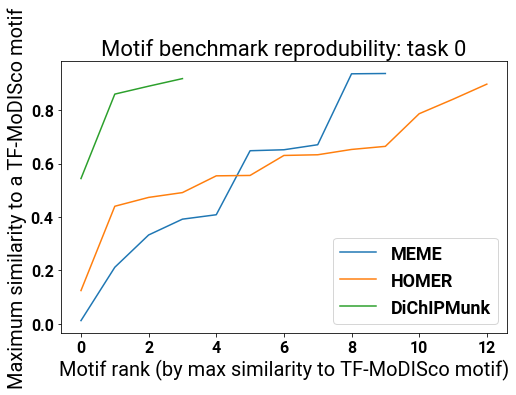

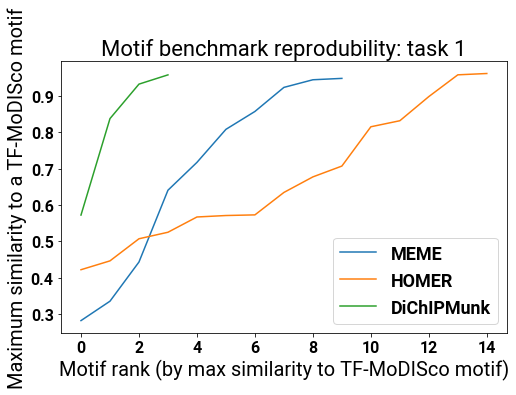

In [11]:
# For each task, plot (cumulative) distribution of similarities
for task_index in range(len(tfm_motifs)):
    
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.plot(
        np.arange(len(meme_sims[task_index])), np.sort(list(meme_sims[task_index].values())),
        label="MEME"
    )
    ax.plot(
        np.arange(len(homer_sims[task_index])), np.sort(list(homer_sims[task_index].values())),
        label="HOMER"
    )
    ax.plot(
        np.arange(len(dichipmunk_sims[task_index])), np.sort(list(dichipmunk_sims[task_index].values())),
        label="DiChIPMunk"
    )
    ax.legend()
    ax.set_xlabel("Motif rank (by max similarity to TF-MoDISco motif)")
    ax.set_ylabel("Maximum similarity to a TF-MoDISco motif")
    ax.set_title("Motif benchmark reprodubility: task %d" % task_index)

In [12]:
# For each task, show the most and least reproducible motifs for each benchmark
num_to_show = 5

cols, heads = [], []
for _ in range(3):
    cols.append(vdomh.col(style={"width": "%.2f%%" % (10 / 3)}))
    cols.append(vdomh.col(style={"width": "%.2f%%" % (90 / 3)}))
    heads.append(vdomh.th("Similarity", style={"text-align": "center"}))
    heads.append(vdomh.th("Motif", style={"text-align": "center"}))
colgroup = vdomh.colgroup(*cols)
header = vdomh.thead(heads)
subheader = vdomh.tr(
    vdomh.td("MEME", colspan="2"),
    vdomh.td("HOMER", colspan="2"),
    vdomh.td("DiChIPMunk", colspan="2"),
)

for task_index in range(len(tfm_motifs)):
    display(vdomh.h3("Task %d" % task_index))
    
    # Rank motif keys by similarity
    meme_keys = sorted(meme_sims[task_index].keys(), key=lambda k: -meme_sims[task_index][k])
    homer_keys = sorted(homer_sims[task_index].keys(), key=lambda k: -homer_sims[task_index][k])
    dichipmunk_keys = sorted(dichipmunk_sims[task_index].keys(), key=lambda k: -dichipmunk_sims[task_index][k])

    display(vdomh.h4("Most reproducible motifs"))

    rows = [subheader]
    for i in range(num_to_show):
        if i >= max([len(meme_keys), len(homer_keys), len(dichipmunk_keys)]):
            break
        row = []
        for key_list, motif_dict, sim_dict in [
            (meme_keys, meme_motifs[task_index], meme_sims[task_index]),
            (homer_keys, homer_motifs[task_index], homer_sims[task_index]),
            (dichipmunk_keys, dichipmunk_motifs[task_index], dichipmunk_sims[task_index])
        ]:
            if i < len(key_list):
                fig = viz_sequence.plot_weights(
                    motif_dict[key_list[i]], figsize=(20, 4), return_fig=True
                )
                fig.tight_layout()
                row.extend([
                    vdomh.td("%.3f" % sim_dict[key_list[i]]),
                    vdomh.td(figure_to_vdom_image(fig))
                ])
            else:
                row.extend([vdomh.td(), vdomh.td()])
        rows.append(vdomh.tr(*row))

    display(vdomh.table(colgroup, header, vdomh.tbody(*rows)))
    plt.close("all")
    
    display(vdomh.h4("Least reproducible motifs"))
    
    rows = [subheader]
    for i in range(num_to_show):
        if i >= max([len(meme_keys), len(homer_keys), len(dichipmunk_keys)]) - num_to_show:
            # Don't show motifs that have already been shown in the previous "most reproducible" table
            break
        row = []
        for key_list, motif_dict, sim_dict in [
            (meme_keys, meme_motifs[task_index], meme_sims[task_index]),
            (homer_keys, homer_motifs[task_index], homer_sims[task_index]),
            (dichipmunk_keys, dichipmunk_motifs[task_index], dichipmunk_sims[task_index])
        ]:
            if i < len(key_list) - num_to_show:
                fig = viz_sequence.plot_weights(
                    motif_dict[key_list[len(key_list) - i - 1]], figsize=(20, 4), return_fig=True
                )
                fig.tight_layout()
                row.extend([
                    vdomh.td("%.3f" % sim_dict[key_list[len(key_list) - i - 1]]),
                    vdomh.td(figure_to_vdom_image(fig))
                ])
            else:
                row.extend([vdomh.td(), vdomh.td()])
        rows.append(vdomh.tr(*row))

    display(vdomh.table(colgroup, header, vdomh.tbody(*rows)))
    plt.close("all")

<h3>Task 0</h3>

<h4>Most reproducible motifs</h4>

MEME,HOMER,DiChIPMunk
0.937,0.897,0.918


<h4>Least reproducible motifs</h4>

<table><colgroup><col style="width: 3.33%"></col><col style="width: 30.00%"></col><col style="width: 3.33%"></col><col style="width: 30.00%"></col><col style="width: 3.33%"></col><col style="width: 30.00%"></col></colgroup><thead><th style="text-align: center">Similarity</th><th style="text-align: center">Motif</th><th style="text-align: center">Similarity</th><th style="text-align: center">Motif</th><th style="text-align: center">Similarity</th><th style="text-align: center">Motif</th></thead><tbody><tr><td colspan="2">MEME</td><td colspan="2">HOMER</td><td colspan="2">DiChIPMunk</td></tr><tr><td>0.012</td><td><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAAEAAElEQVR4nOzdd3hU1dbA4d%2BZmUx66IQqvTfpYEFUFDsqdrFeP7tYr3rVe/XaEbtiL2DjqggK0juE3nsLvRNCSZ96vj92AglTM5marPd55gnMOTN7B6acs87aa2m6riOEEEIIIYQQQgghhBBCBJsh0hMQQgghhBBCCCGEEEIIUTlJAFoIIYQQQgghhBBCCCFESEgAWgghhBBCCCGEEEIIIURISABaCCGEEEIIIYQQQgghREhIAFoIIYQQQgghhBBCCCFESEgAWgghhBBCCCGEEEIIIURISABaCCGEEEIIIYQQQgghREhIAFoIIYQQQgghhBBCCCFESEgAWgghhBBCCCGEEEIIIURISABaCCGEEEIIIYQQQgghREiYIj2BYKldu7betGnTSE9DCCGEEEIIIYQQQgghKrUVK1Yc1XW9jj/7VpoAdNOmTVm%2BfHmkpyGEEEIIIYQQQgghhBCVmqZpu/3dV0pwCCGEEEIIIYQQQgghhAgJCUALIYQQQgghhBBCCCGECAkJQAshhBBCCCGEEEIIIYQICQlACyGEEEIIIYQQQgghhAgJCUALIYQQQgghhBBCCCGECAkJQAshhBBCCCGEEEIIIYQICQlACyGEEEIIIYQQQgghhAgJCUALIYQQQgghhBBCCCGECAkJQAshhBBCCCGEEEIIIYQICQlACyGEEEIIIYQQQgghhAgJCUALIYQQQgghhBBCCCGECAkJQAshhBBCCCGEEEIIIYQICQlACyGEEEIIIYQQQgghhAgJCUALIYQQQgghhBBCCCGECAkJQAshhBBCCCGEEEIIIYQICQlACyGEEEIIIYQQQgghhAgJCUALIYQQQgghhBBCCCGECAkJQAshhBBCCCGEEEIIIYQICQlACyGEEEIIIYQQQgghhAgJCUALIYQQQgghhBBCCCGECAkJQAshhBBCCCGEEEIIIYQICQlACyGEEEIIIYQQQgghhAgJCUALIYQQQgghhBBCCCGECAkJQAshhBBCCCGEEEIIIYQICQlACyGEEEIIIYQQQgghhAgJCUALIYQQQgghhBBCCCGECAkJQAshhBBCCCGEEEIIIYQIiYAD0Jqm1dI07XFN01ZrmtbHx74Jmqa9r2naAU3TLJqmrdU07YYz9jFomvaSpmm7ivfZqmnaw4HOTwghhBBCCCGEEEIIIURkmcr7AE3TzgeGAtcAZj8f9i1wW/GfC4FOwG%2Bapl2p6/rk4vtfA14otU8rYISmaU5d178o7zyFEEIIIYQQQgghhBBCRFYgGdBPAzcANn921jStBSr4rAN9gBRUQFoDXireJwV4svghN%2Bm6ngS8XPz3FzVN0wKYpxBCCCGEEEIIIYQQQogICiQAPQ0VgK7j5/79in%2Bu1XV9ia7rTuDL4vt6aZpmBnoCicAJXdd/L972efHPRkCzAOYphBBCCCGEEEIIIYQQIoLKXYJD1/XPSv7sZ2Jy/eKfR0rdd7DU%2BLVL7ZNVapwsTdPsxfvUA3aUd65CCCGEEEIIIYQQQgghIqfcAegAlNSJdpa6z37Gdnf7ADhQc/S31nSV5tSdPDbpMd4e8Dap8amRno4QQgSV0wmbN8PChTBzJuzbB/n5UFQEJhMkJUG1anDeeXD%2B%2BdCzJyQnR2auDqeDoZOH8t7A90gwJURmEuX0w%2BofsDqt3NftvkhPRYiA/bbhN3Snzs2dbo70VPyWlwcbNsDatbB8OWzcCAUF6rNN18FshoQEaNgQ%2BvaFTp2gc2eoVw%2BkSF0l5rDAibVwdAkcmQOFB8FeAM4i0OLAlARxaVD7HKjdF2r1hPiakZ51zLDbITPz9Htv2TI4ehQsFrBawWhU77vkZOjSBbp2hY4doX37yB1bCCGEELEsHAHokNE07X7gfoCzzjorwrOJvLWH1/LZ8s%2B4tMWlDGo7KPgD1KsHhw8H/3lDxWBQEatYEmtzjrX5QuzNOdbmC5CeDocOBeWpdu2CH3%2BEqVNh1Sr1z6HrKvDsyezZkJgIhYXQpAlcdBFcdx0MHBi%2BYM36I%2Bv5bPln3NrxVs5rcl54Bq2gx6c%2BjsPp4B9d/%2BHvCif/xdr3B8Teey/W5gtB/awo8ez0Z9GJ7gC03Q7TpsFXX8HixZCdrS6g2e0q8OzN33%2BrzzeLRQXI2raFu%2B%2BGW2%2BFWrXcPCDW3ntV/XWctQh2joQj8yB3O5gSwWkDR6HnxxyerYLRjiIw14RaveGswXDWTWCMd90/1l4TEJR/Y12Hdetg5Ej48091ETs%2BXr3k8vPB4fD82HnzVNDZaFTv0Ro11MXuf/wDLr0U4uLOeEAs/hvH2nsv1uYLsTfnWJsvxN6cY22%2BEHtzjrX5QkiOj6NFOALQJc0KS49lLPVni4d9Su9ncffEuq5/BXwF0KNHD71i04x9UzKnnPoZkgB0rB1IxdoHDcTenGNtvhB7c461%2BUJQPivWr4eXX4ZJk9Q/gdXq/2NtNnUDld2UmQm//AJ16sDrr8NNN6mM6VCau3suAPP2zIuJAPTqQ6s5UXQCgKX7l9K7Ue/gDhBr3x8Qe%2B%2B9WJsvBP11oes6B3IPAGpVmEELpNVJ6KxeDd98oy6q6Trk5p7elpPj33NYrWU/D1esgE2b4Jln1MqPRx6BK65QWdNA7L33quLr2GmDPX/A%2Btcgfzc4ClC92zn9ZeaNbgdb8Quo6BDs/wsOz4Tlj0Gbx6H1o5BQqnVPrL0moEJzLrmQ/c03KsO59DGCP/%2B8JUpf%2BM7KgnHj1GospxNuvBHuvRfOOUfFOmLy3zjW3nuxNl%2BIvTnH2nwh9uYca/OF2JtzrM0XYvM7xE/hODIvCd03KHVfveKfVuBoqX3SNU0zAmiaVovTAekDoZ5kZTBu0zgAJmdOjvBMhBAiMAsXqozlXr3gr7/UEvTyBJ89ycuDnTvhgQfUMvYRI1SGdKhM2japzM9o9%2BXyL0/9%2BYvlX0RwJkIEbkv2FmxOGzanjS1Ht0R6OqdMnw6tW8O558KXX6pgc%2Bngc0UVFKiM6Bkz4M47VSb0q6%2Bq%2B0QUs56EDW/D2Pqw9P8gZyM48jkVfK4Iex7YTsKmd%2BDPs2DhEDi5qeLPG0M2b1bHE%2B3a

<h3>Task 1</h3>

<h4>Most reproducible motifs</h4>

MEME,HOMER,DiChIPMunk
0.948,0.961,0.958


<h4>Least reproducible motifs</h4>

<table><colgroup><col style="width: 3.33%"></col><col style="width: 30.00%"></col><col style="width: 3.33%"></col><col style="width: 30.00%"></col><col style="width: 3.33%"></col><col style="width: 30.00%"></col></colgroup><thead><th style="text-align: center">Similarity</th><th style="text-align: center">Motif</th><th style="text-align: center">Similarity</th><th style="text-align: center">Motif</th><th style="text-align: center">Similarity</th><th style="text-align: center">Motif</th></thead><tbody><tr><td colspan="2">MEME</td><td colspan="2">HOMER</td><td colspan="2">DiChIPMunk</td></tr><tr><td>0.283</td><td><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAAEAAElEQVR4nOydd3gc1fn9z2wvKpZkdVsucgE3bIzpYCAESAKEToBQkl/aNyEhnYQAgRQS0hNIIyGBhARC782AwdjGuMtdtmRb0lpatZW02l5mfn9crbRT7taZLdL9PI8eW7OzM7Orndk75573vJwgCGAwGAwGg8FgMBgMBoPBYDAYDAZDbXT5PgAGg8FgMBgMBoPBYDAYDAaDwWBMTpgAzWAwGAwGg8FgMBgMBoPBYDAYDE1gAjSDwWAwGAwGg8FgMBgMBoPBYDA0gQnQDAaDwWAwGAwGg8FgMBgMBoPB0AQmQDMYDAaDwWAwGAwGg8FgMBgMBkMTmADNYDAYDAaDwWAwGAwGg8FgMBgMTWACNIPBYDAYDAaDwWAwGAwGg8FgMDSBCdAMBoPBYDAYDAaDwWAwGAwGg8HQBCZAMxgMBoPBYDAYDAaDwWAwGAwGQxOYAM1gMBgMBoPBYDAYDAaDwWAwGAxNMOT7ANRi%2BvTpwuzZs/N9GAwGg8FgMBgMBoPBYDAYDAaDManZtm3bgCAI1amsO2kE6NmzZ2Pr1q35PgwGg8FgMBgMBoPBYDAYDAaDwZjUcBzXkeq6LIKDwWAwGAwGg8FgMBgMBoPBYDAYmsAEaAaDwWAwGAwGg8FgMBgMBoPBYGgCE6AZDAaDwWAwGAwGg8FgMBgMBoOhCUyAZjAYDAaDwWAwGAwGg8FgMBgMhiYwAZrBYDAYDAaDwWAwGAwGg8FgMBiawARoBoPBYDAYDAaDwWAwGAwGg8FgaAIToBkMBoPBYDAYDAaDwWAwGAwGg6EJTIBmMBgMBoPBYDAYDAaDwWAwGAyGJjABmsFgMBgMBoPBYDAYDAaDwWAwGJrABGgGg8FgMBgMBoPBYDAYDAaDwWBoAhOgGQwGg8FgMBgMBoPBYDAYDAaDoQlMgGYwGAwGg8FgMBgMBoPBYDAYDIYmMAGawWAwGAwGg8FgMBgMBoPBYDAYmsAEaAaDwWAwGAwGg8FgMBgMBoPBYGgCE6AZDAaDwWAwGAwGg8FgMBgMBoOhCUyAZjAYDAaDwWAwGAwGg8FgMBgMhiYwAZrBYDAYDAaDwWAwGAwGg8FgMBiawARoBoPBYDAYDAaDwWAwGAwGg8FgaAIToBkMBoPBYDAYDAaDwWAwGAwGg6EJTIBmMBgMBoPBYDAYDAaDwWAwGAyGJjABmsFgMBgMBoPBYDAYDAaDwWAwGJrABGgGg8FgMBgMBoPBYDAYDAaDwWBoAhOgGQwGg8FgMBgMBoPBYDAYDAaDoQlMgGYwGAwGg8FgMBgMBoPBYDAYDIYmMAGawWAwGAwGg8FgMBgMBoPBYDAYmsAEaAaDwWAwGAwGg8FgMBgMBoPBYGgCE6AZDAaDwWAwGAwGg8FgMBgMBoOhCRkL0BzHVXEcdxvHcTs5jjs1yboWjuN%2Bw3FcN8dxQY7jdnEcd5VkHR3HcXdyHHd0bJ2DHMd9OdPjYzAYDAaDwWAwGAwGg8FgMBgMRn4xpPsEjuPOAvA1AJcCMKX4tIcBXD/2fz%2BApQCe5DjuE4IgvDa2/McA7ohbZz6AP3IcxwuC8Jd0j5PBYDAYDAaDwWAwGAwGg8FgMBj5JRMH9LcAXAUgnMrKHMc1g4jPAoBTAZSACNIcgDvH1ikB8I2xp1wjCIINwA/Hfv8Bx3FcBsfJYDAYDAaDwWAwGAwGg8FgMBiMPJKJAP0miABdneL6Z4/9u0sQhA8FQeAB/HVs2ckcx5kArAJgBTAsCMJTY4/9eezfGQDmZHCcDAaDwWAwGAwGg8FgMBgMBoPByCNpR3AIgvCn2P9TNCbXj/3bF7esJ27/0%2BPW6Y/bTz/HcZGxdeoAHE73WBkMBoPBYDAYDAaDwWAwGAwGg5E/0hagMyCWE83HLYtIHldaBwCiIMeYatZ0UfLfXf9FfWk9zp1zbl72/9z%2B56Dn9Lj0uEvzsv%2B3j7yNPk8frlt6XV72n29anC14q/0tfOuMb%2BX7UPJHNAj0bwCOvQwMbgYiowAfAQx2wDYTmHEpUH8BYK1Pvq0iheeBdeuAl14C3n0X8PuBqirg0kuBiy8Gjj8%2B30c4uQmFgFdeIX%2BDjRuB0VHAbAZOPBE4%2B2zgssuA8nJtj%2BHgQeDll4EXXwT6%2BgCLhez74ouBc88F9Hpt959PBAF4/33gnXfI57%2BvD9DpgIULgXPOAS65BJg9W9tj2LwZWLMGWLsW6BmbJm9uJu/9xz9OjkVLWlqAN94g%2B%2B/sJMuamsj%2BL7oIWLZM2/3ni66RLjy681HcufrO/B5INAQ43wKOvQgMbAL4MGBtAGZeBjReDNhnabJbXuBx%2B1u34/7z74eOy7g3eFbc8fYduP2M21Fu0fgil4SeHuCJJ4AnnwTcbqCyEvjUp4BrrgGqU627zIAHNj2AC%2BdfiAVVC7TbSaHDRwHnm0Dvu0D/%2B0BoGNAZgfIlQO05QOOlgLU2zwc5iQkNAc63AccLwOghIOIBwAGGEmDaUjIOrjkHMJaovuudzp14v%2BN9fPWUr6q%2B7WKg19OLh7Y9hLtW35XfA/H3AI4Xgb53gZG95D7IXAlUn03OwbrzgTx9RzAYucDrJffBjz5KxsEWC3DhhcCNN2p7H/zM/mcAAbhy0ZXa7YQxDicIQuZP5rjYk08TBGETZZ17QPKc3xAE4aKxZXWYcEHPAXAOgH8CaBUE4bi45wYAmAGcKwjCuwrb/gKALwBAU1PTyo6OjoxfSz6Z%2BduZWFy9GK9/%2BvW87H/xHxdDx%2Bmw%2B8u787L/C/59AVoHWtHxjSz%2BfnV1QG%2BvegeVLrW1gNOZ0VNvfeVWPLT9IYTuCmW%2B/2J9/d2vAfvuJzf7OjMQ8YLMO0kwlEyIAbNvABZ9FzCWTjye79cPZPUZWLsW%2BOIXyc233w9E494Cs5kIceefD/z%2B98AcWiBRvt8DnY6o6Pkiw/d/eBj485%2BBX/4SiEQAj4eIofGUlJC/yf/7f8B3vkNEQTXp6gK%2B8Q3g1VfJvgOBicf0esBmA6ZPB/7yF%2BCCCygbyfffP8P3PxwGnnoK%2BOEPydMDAfJ3iMdqJe/L%2BeeT9U46SaVjBvm7vvgi2e7hw2QiIizpcBE7B089